# Exercizes on clustering

Here you can find a program to read a data file in csv format. 

The data file has the following heading:
    number of samples, number of features
    list of the names of the features (separated by comma)
    
The remaining lines contain an example per row.
For each row there is a list of real numbers (commas separated) which are the feature values.   

In [1]:
import csv
import sys
from os.path import join

import numpy as np
 
# this function reads the data file, loads the configuration attributes specifiefd in the heading
# (numer of examples and features), the list of feature names
# and loads the data in a matrix named data    
def load_data(file_path, file_name):
   with open(join(file_path, file_name)) as csv_file:
       data_file = csv.reader(csv_file,delimiter=',')
       temp1 = next(data_file)
       n_samples = int(temp1[0])
       print("n_samples=")
       print(n_samples)
       n_features = int(temp1[1])
       temp2 = next(data_file)
       feature_names = np.array(temp2[:n_features])

       data_list = [iter for iter in data_file]
               
       data = np.asarray(data_list, dtype=np.float64)                  
       
   return(data,feature_names,n_samples,n_features)

# The main program reads the input file containing the dataset
# file_path is the file path where the file with the data to be read are located
# we assume the file contains an example per line
# each example is a list of real values separated by a comma (csv format)
# The first line of the file contains the heading with:
# N_samples,n_features,
# The second line contains the feature names separated by a comma     

#file_path="content/"
file_path="../Datasets_for_clustering/"
# all the three datasets contain data points on (x,y) 
file_name1="3-clusters.csv"
file_name2="dataset-DBSCAN.csv"     
file_name3="CURE-complete.csv"    
data1,feature_names1,n_samples1,n_features1 = load_data(file_path, file_name1)
data2,feature_names2,n_samples2,n_features2 = load_data(file_path, file_name2)
data3,feature_names3,n_samples3,n_features3 = load_data(file_path, file_name3)
print("dataset n. 1: n samples, n features")
print(n_samples1, n_features1)
print("dataset n. 2: n samples, n features")
print(n_samples2, n_features2)
print("dataset n. 3: n samples, n features")
print(n_samples3, n_features3)

n_samples=
150
n_samples=
6118
n_samples=
86558
dataset n. 1: n samples, n features
150 2
dataset n. 2: n samples, n features
6118 2
dataset n. 3: n samples, n features
86558 2


The following program plots the dataset n.1

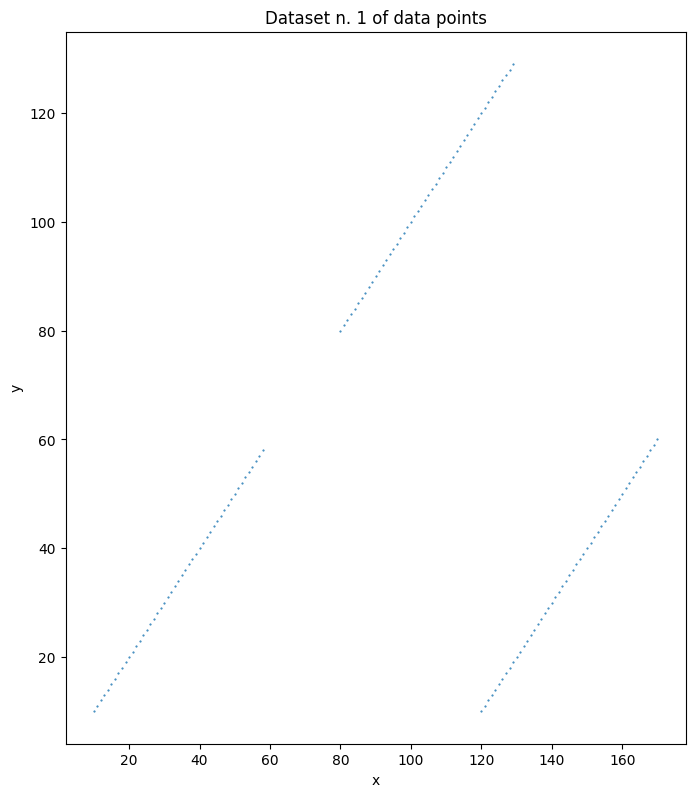

In [5]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 1 of data points')

ax.set_xlabel(feature_names1[0]) # Asse x abbiamo la prima feature
ax.set_ylabel(feature_names1[1]) # Asse y abbiamo la seconda feature

#plot the dataset
plt.plot(data1[:,0], data1[:,1], '.',markersize=1)

plt.show()

The following is the program for plotting the dataset n.2

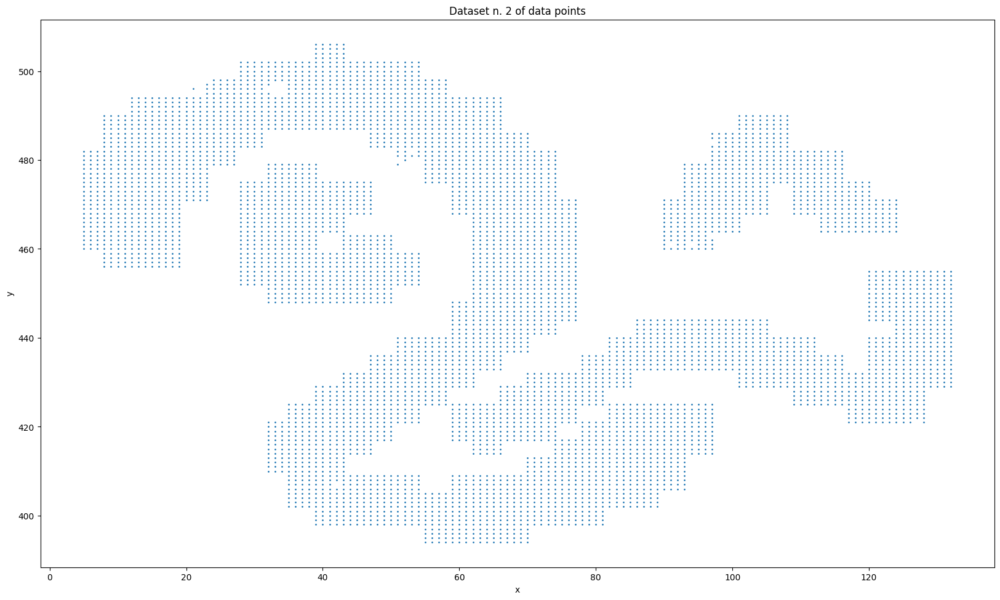

In [4]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 2 of data points')

ax.set_xlabel(feature_names2[0])
ax.set_ylabel(feature_names2[1])

#plot the dataset
plt.plot(data2[:,0], data2[:,1], '.', markersize=2)

plt.show()

# Qua avremo problemi con k-means perchè cerca di creare cluster globulari e qui non si riesce

The following is the program for plotting the dataset n.3

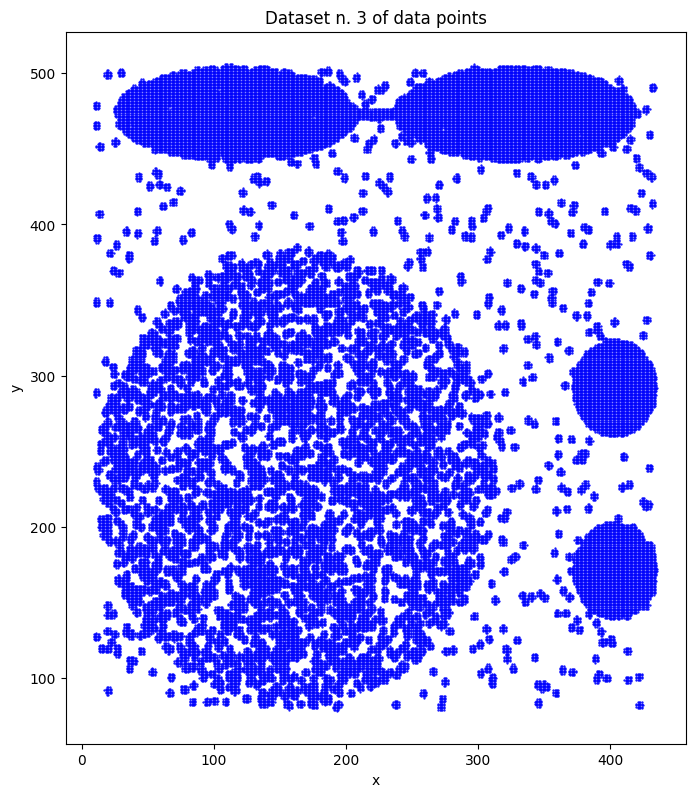

In [5]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 3 of data points')

ax.set_xlabel(feature_names3[0])
ax.set_ylabel(feature_names3[1])

#plot the dataset
plt.plot(data3[:,0], data3[:,1], '.', markersize=1.2, markeredgecolor = 'blue')

plt.show()

# Se da problemi di lentezza, si può utilizzare il knowledge discovery e utilizzare tipo il 10% del dataset facendo campionamento

## In the following program we cluster the dataset n.1 with K-means. 
From the plot of dataset n.1 we see 3 separated clusters. Thus k=3. 

In [6]:
import csv
import sys
from os.path import join

import numpy as np
 
def load_data(file_path, file_name):
   with open(join(file_path, file_name)) as csv_file:
       data_file = csv.reader(csv_file,delimiter=',')
       temp1 = next(data_file)
       n_samples = int(temp1[0])
       n_features = int(temp1[1])
       temp2 = next(data_file)
       feature_names = np.array(temp2[:n_features])

       data_list = [iter for iter in data_file]
               
       data = np.asarray(data_list, dtype=np.float64)                  
       
   return(data,feature_names,n_samples,n_features)

# The main program reads the input file containing the dataset
# file_path is the file path where the file with the data to be read are located
# we assume the file contains an example per line
# each example is a list of real values separated by a comma (csv format)
# The first line of the file contains the heading with:
# N_samples,n_features,
# The second line contains the feature names separated by a comma     

#file_path="~/meo/Documents/Didattica/Laboratorio-15-16-Jupyter/"
file_path="../Datasets_for_clustering/"
# all the three datasets contain data points on (x,y) 
file_name1="3-clusters.csv"

data1,feature_names1,n_samples1,n_features1 = load_data(file_path, file_name1)

from sklearn.cluster import KMeans

np.random.seed(5)

k=3
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(data1)
cluster_labels1 = kmeans1.predict(data1)

i=0
for i in range(n_samples1):
    print("Example n."+str(i)+"=("+str(data1[i,0])+","+str(data1[i,1])+")")
    print("in cluster n."+str(kmeans1.labels_[i]))

Example n.0=(10.0,10.0)
in cluster n.0
Example n.1=(11.0,11.0)
in cluster n.0
Example n.2=(12.0,12.0)
in cluster n.0
Example n.3=(13.0,13.0)
in cluster n.0
Example n.4=(14.0,14.0)
in cluster n.0
Example n.5=(15.0,15.0)
in cluster n.0
Example n.6=(16.0,16.0)
in cluster n.0
Example n.7=(17.0,17.0)
in cluster n.0
Example n.8=(18.0,18.0)
in cluster n.0
Example n.9=(19.0,19.0)
in cluster n.0
Example n.10=(20.0,20.0)
in cluster n.0
Example n.11=(21.0,21.0)
in cluster n.0
Example n.12=(22.0,22.0)
in cluster n.0
Example n.13=(23.0,23.0)
in cluster n.0
Example n.14=(24.0,24.0)
in cluster n.0
Example n.15=(25.0,25.0)
in cluster n.0
Example n.16=(26.0,26.0)
in cluster n.0
Example n.17=(27.0,27.0)
in cluster n.0
Example n.18=(28.0,28.0)
in cluster n.0
Example n.19=(29.0,29.0)
in cluster n.0
Example n.20=(30.0,30.0)
in cluster n.0
Example n.21=(31.0,31.0)
in cluster n.0
Example n.22=(32.0,32.0)
in cluster n.0
Example n.23=(33.0,33.0)
in cluster n.0
Example n.24=(34.0,34.0)
in cluster n.0
Example n.

In the following program we plot the clusters

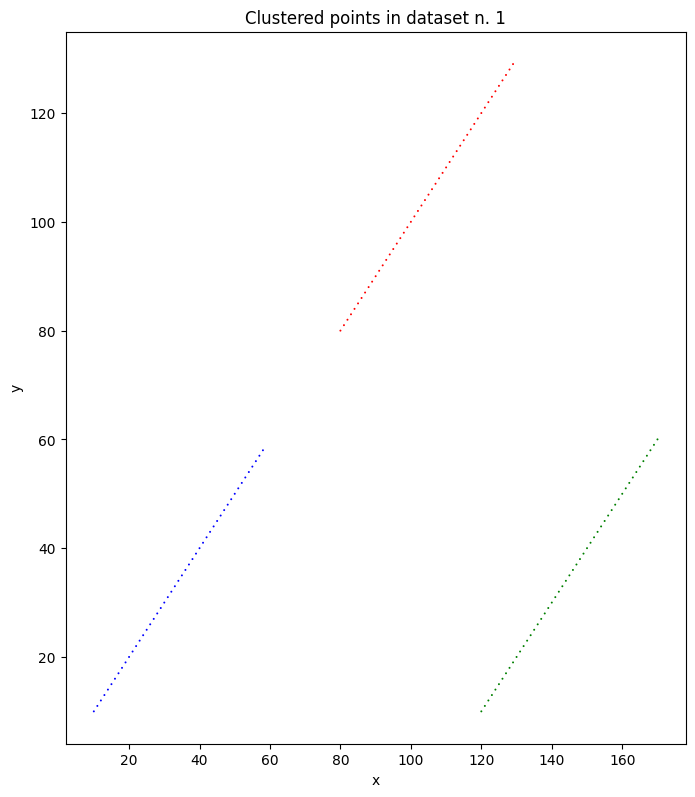

In [7]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 1')

ax.set_xlabel('x')
ax.set_ylabel('y')

# set the list of colors to be selected when plotting the different clusters
color=['b','g','r','c','m','y','k','w']
    
#plot the dataset
for clu in range(k):
    # collect the sequence of cooordinates of the points in each given cluster (determined by clu)
    data_list_x = [data1[i,0] for i in range(n_samples1) if kmeans1.labels_[i]==clu]
    data_list_y = [data1[i,1] for i in range(n_samples1) if kmeans1.labels_[i]==clu]
    plt.scatter(data_list_x, data_list_y, s=2, edgecolors='none', c=color[clu], alpha=1)

plt.show()

## Definisco funzioni di K-Means

Definite funzione di K-Means e la funzione di plotting

In [8]:
from sklearn.cluster import KMeans

# Restituisco i centroidi e le etichette dei cluster
def compute_kmeans(dataset, k):
    random_seed = np.random.seed(0)
    kmeans = KMeans(n_clusters=k, random_state=random_seed).fit(dataset)
    cluster_labels = kmeans.predict(dataset)
    return kmeans, cluster_labels

In [9]:
def plot(title, data, n_samples, k, kmeans):
    fig = plt.figure(figsize=(8,8))

    ax = fig.add_subplot(111)
    fig.subplots_adjust(top=1)
    ax.set_title(title)

    ax.set_xlabel('x')
    ax.set_ylabel('y')

    # set the list of colors to be selected when plotting the different clusters
    color=['b','g','r','c','m','y','k','w']

    for clu in range(k):
        data_list_x = [data[i,0] for i in range(n_samples) if kmeans.labels_[i]==clu]
        data_list_y = [data[i,1] for i in range(n_samples) if kmeans.labels_[i]==clu]
        plt.scatter(data_list_x, data_list_y, s=2, edgecolors='none', c=color[clu], alpha=1)

## Nella cella successiva ho eseguito K-means sul dataset 2 e plottato il risultato

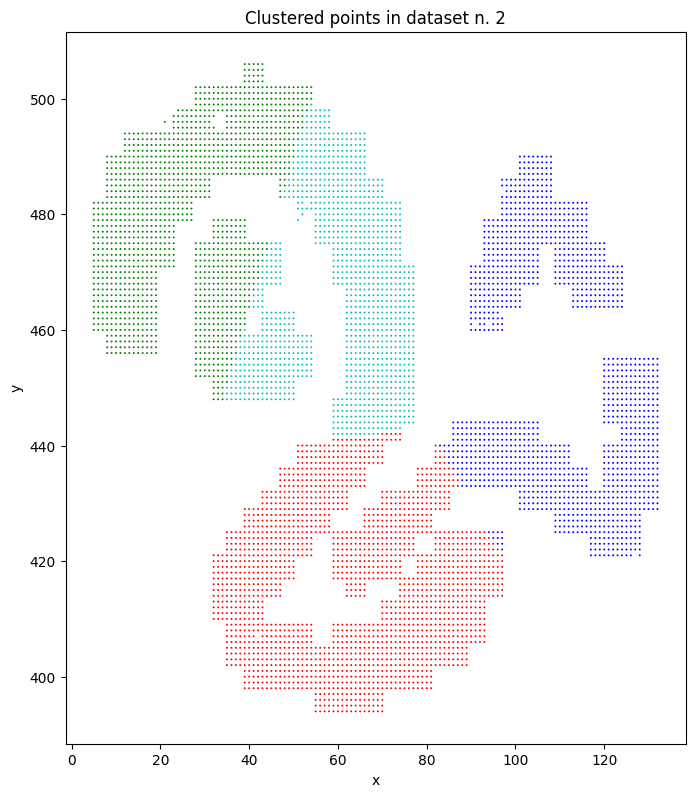

In [10]:
import matplotlib.pyplot as plt

k = 4
kmeans2, cluster_labels2 = compute_kmeans(data2, k)

plot('Clustered points in dataset n. 2', data2, n_samples2, k, kmeans2)

# Come si può vedere, il clustering con KMeans non riesce a separare bene i dati.
# Mette insieme i punti che sono vicini tra loro, ma non separa bene i cluster.
# Usando KMeans ad ogni iterazione viene ricalcolato il centroide e gli esempi vengono assegnati al corrispettivo cluster più vicino basandosi sulla distanza dai centroidi.
# Per questo principio di funzionamento, KMeans non separa bene i cluster, anzi tende a mettere insieme punti che sono vicini tra loro ma che dovrebbero essere di clusters differenti.
# Inoltre, KMeans, predilige cluster con forma circolare.

## Nella cella successiva ho eseguito K-means sul dataset 3 e plottato il risultato

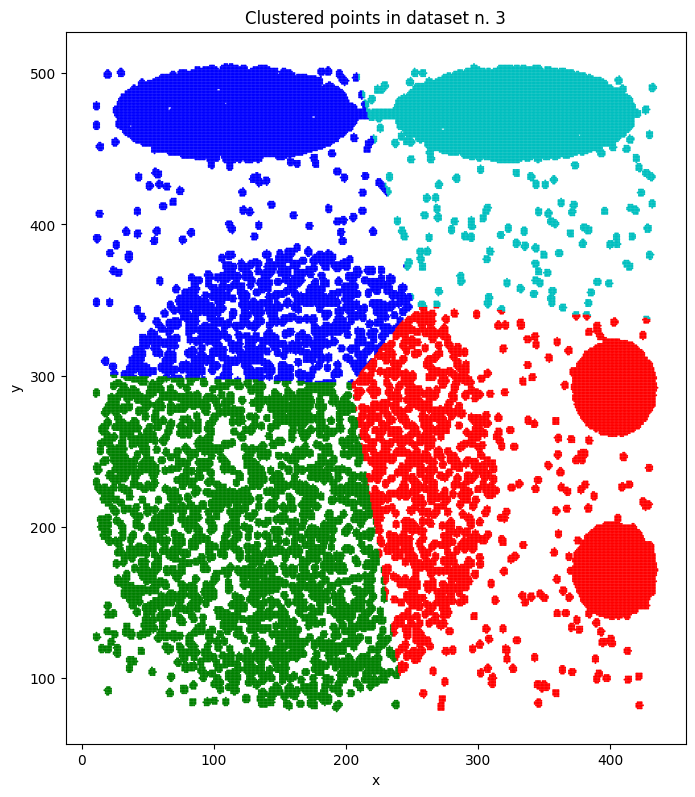

In [36]:
import matplotlib.pyplot as plt
k = 4
kmeans3, cluster_labels3 = compute_kmeans(data3, k)

plot('Clustered points in dataset n. 3', data3, n_samples3, k, kmeans3)

# Come si può vedere, il clustering con KMeans non riesce a separare bene i dati.
# Mette insieme i punti che sono vicini tra loro, ma non separa bene i cluster.
# Usando KMeans ad ogni iterazione viene ricalcolato il centroide e gli esempi vengono assegnati al corrispettivo cluster più vicino basandosi sulla distanza dai centroidi.
# Per questo principio di funzionamento, KMeans non separa bene i cluster, anzi tende a mettere insieme punti che sono vicini tra loro ma che dovrebbero essere di clusters differenti.
# Inoltre, KMeans, predilige cluster con forma globulare.

# Nello specifiico, KMeans unisce i punti vicini tra loro non considerando che ci sono punti di Noise ed a più bassa densità.
# Questo dataset è un caso specifico dove DBSCAN riesce a separare meglio i cluster rispetto a KMeans.

## Definisco funzioni per la Silhouette

In [12]:
from sklearn.metrics import silhouette_score

# Mi restituisce il valore del coefficiente di silhouette per un dato numero di cluster
def compute_silhouette_score(dataset, k):
    _, cluster_labels = compute_kmeans(dataset, k)
    return silhouette_score(dataset, cluster_labels)

## Silhouette Analysis per il dataset 1

In [13]:
best_silhouette1 = -1
best_k1 = None

# Calcolo il coefficiente di silhouette per cluster da 2 a 11 e salvo il valore migliore
for num in range(2,12):
    k = num
    silhouette_avg1 = compute_silhouette_score(data1, k)
    if (silhouette_avg1 > best_silhouette1):
        best_silhouette1 = silhouette_avg1
        best_k1 = k
    print(
        "For k =",
        k,
        "The average silhouette_score is :",
        silhouette_avg1,
    )

For k = 2 The average silhouette_score is : 0.5651096232579514
For k = 3 The average silhouette_score is : 0.7229402453727759
For k = 4 The average silhouette_score is : 0.6824925173029859
For k = 5 The average silhouette_score is : 0.6358957746571624
For k = 6 The average silhouette_score is : 0.6113129278986535
For k = 7 The average silhouette_score is : 0.595587703417737
For k = 8 The average silhouette_score is : 0.5798237614544337
For k = 9 The average silhouette_score is : 0.5655287896062917
For k = 10 The average silhouette_score is : 0.5556981396710137
For k = 11 The average silhouette_score is : 0.5466978848307029


## Silhouette Analysis per il dataset 2

In [14]:
best_silhouette2 = -1
best_k2 = None
for num in range(2,12):
    k = num
    silhouette_avg2 = compute_silhouette_score(data2, k)
    if (silhouette_avg2 > best_silhouette2):
        best_silhouette2 = silhouette_avg2
        best_k2 = k
    print(
        "For k =",
        k,
        "The average silhouette_score is :",
        silhouette_avg2,
    )

For k = 2 The average silhouette_score is : 0.43322366812579544
For k = 3 The average silhouette_score is : 0.47977770120112256
For k = 4 The average silhouette_score is : 0.4165945460308033
For k = 5 The average silhouette_score is : 0.4256111365510684
For k = 6 The average silhouette_score is : 0.41166328241333594
For k = 7 The average silhouette_score is : 0.4337052476160541
For k = 8 The average silhouette_score is : 0.4452323942316648
For k = 9 The average silhouette_score is : 0.4473004168330033
For k = 10 The average silhouette_score is : 0.43970093979355046
For k = 11 The average silhouette_score is : 0.43646487934460665


## Rendo il dataset più piccolo per riuscire ad eseguire la Silhouette

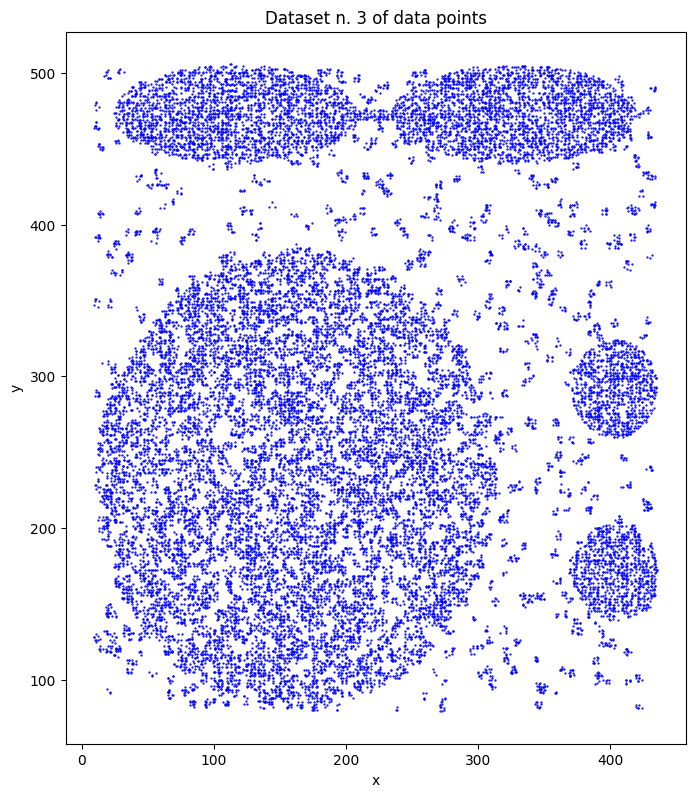

In [18]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 3 of data points')

ax.set_xlabel(feature_names3[0])
ax.set_ylabel(feature_names3[1])

arrayIndex = np.random.randint(0, len(data3), size=int(len(data3)*0.3))
data3_extract = data3[arrayIndex, :]

# Effettuo il plot dei punti estratti casualmente dal dataset originale (30% dei punti)
plt.plot(data3_extract[:,0], data3_extract[:,1], '.', markersize=1.2, markeredgecolor = 'blue')

plt.show()

## Silhouette Analysis per il dataset 3

In [16]:
best_silhouette3 = -1
best_k3 = None
for num in range(2,12):
    k = num
    silhouette_avg3 = compute_silhouette_score(data3_extract, k)
    if (silhouette_avg3 > best_silhouette3):
        best_silhouette3 = silhouette_avg3
        best_k3 = k
    print(
        "For k =",
        k,
        "The average silhouette_score is :",
        silhouette_avg3,
    )

For k = 2 The average silhouette_score is : 0.38411366537801
For k = 3 The average silhouette_score is : 0.389922756520587
For k = 4 The average silhouette_score is : 0.41132545420967676
For k = 5 The average silhouette_score is : 0.4158392071267933
For k = 6 The average silhouette_score is : 0.42913394571970637
For k = 7 The average silhouette_score is : 0.4254480855780079
For k = 8 The average silhouette_score is : 0.4273835135244368
For k = 9 The average silhouette_score is : 0.42217405672100194
For k = 10 The average silhouette_score is : 0.39802291005608664
For k = 11 The average silhouette_score is : 0.415614576105843


## Definisco la funzione per fare plot delle iterazioni con diverso valore dell'iperparametro k con la Silhouette

In [17]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

# Calcolo il coefficiente di silhouette per un dato numero di cluster e plotto i risultati (silhouette score e clusters)
def plot_silhouette(dataset):
    for n_clusters in range(2, 12):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 5)
        fig.set_facecolor('white')

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([0, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(dataset) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmeans, cluster_labels  = compute_kmeans(dataset, n_clusters)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(dataset, cluster_labels)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(dataset, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            dataset[:, 0], dataset[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        centers = kmeans.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with k = %d and average silhouette score = %.3f"
            % (n_clusters, silhouette_avg),
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

## Plot della Silhouette con differenti numero k di clusters per il dataset 1

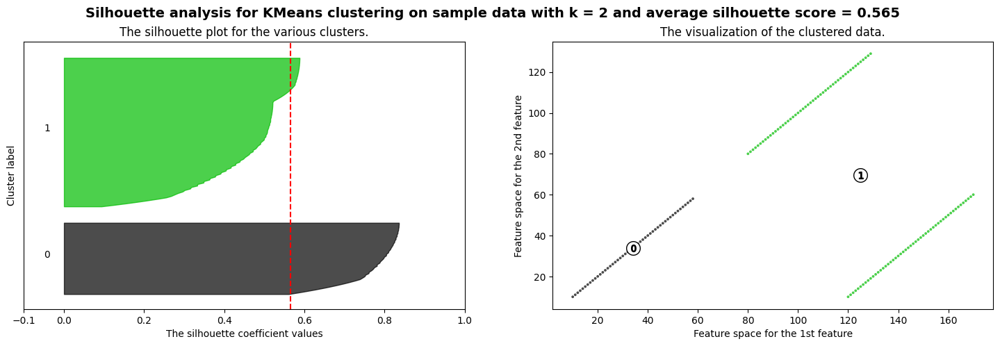

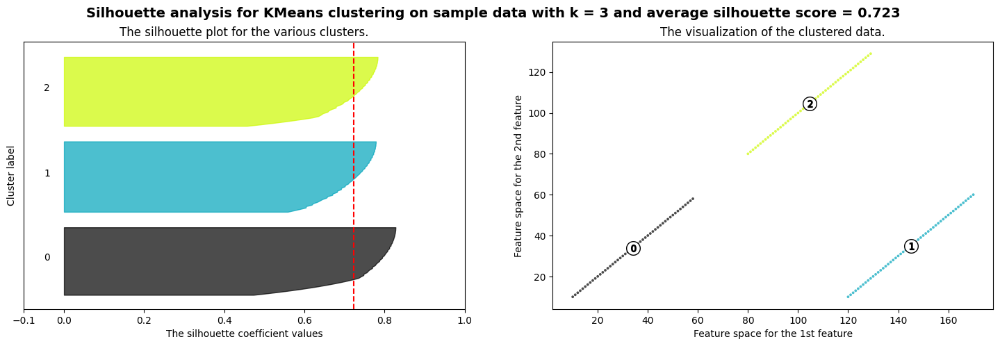

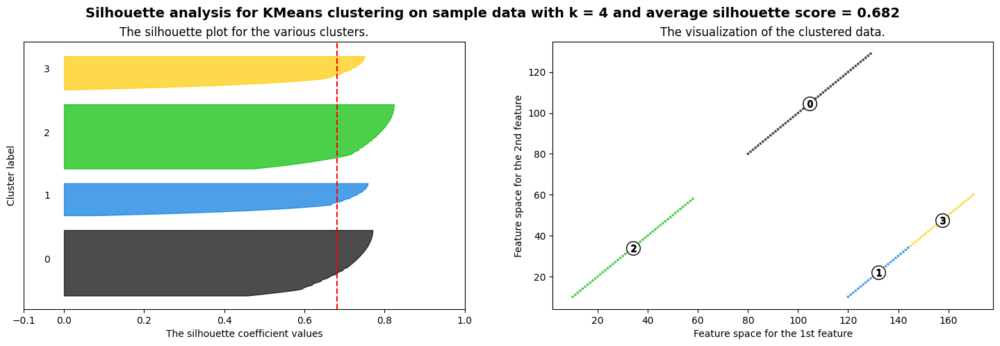

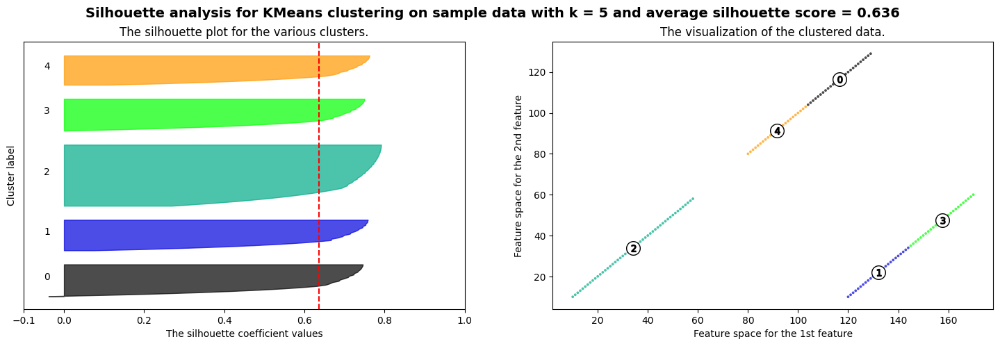

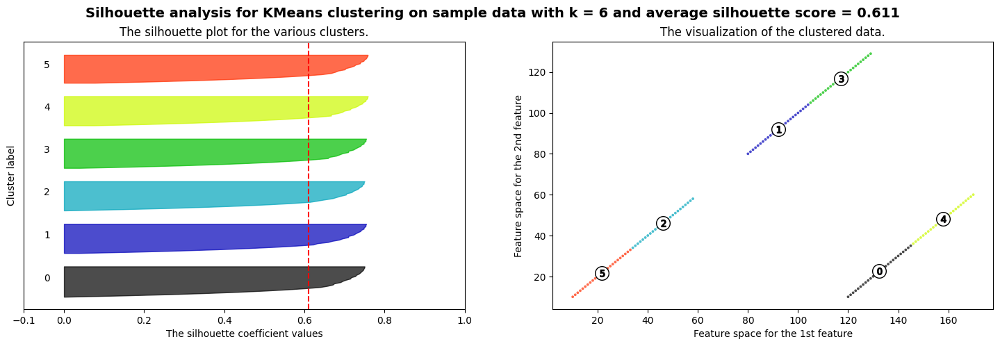

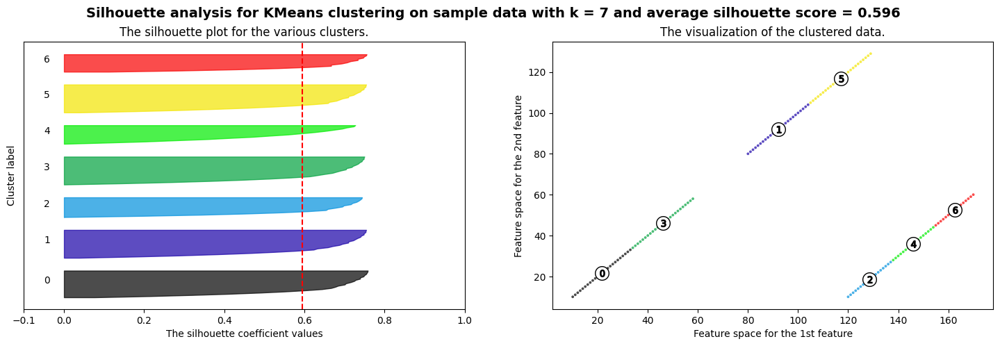

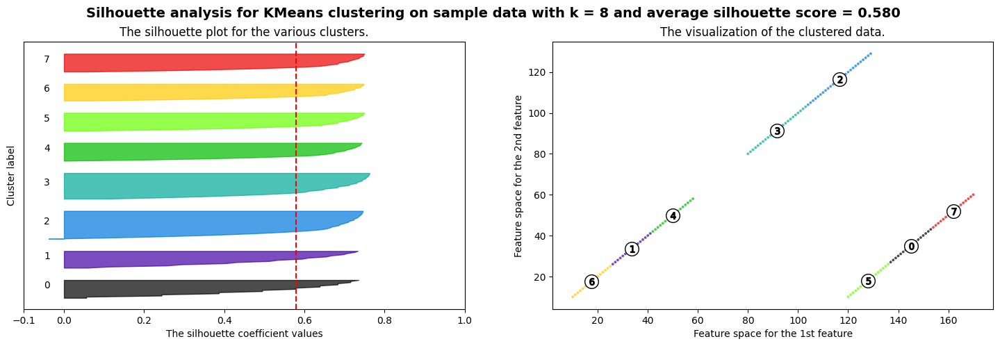

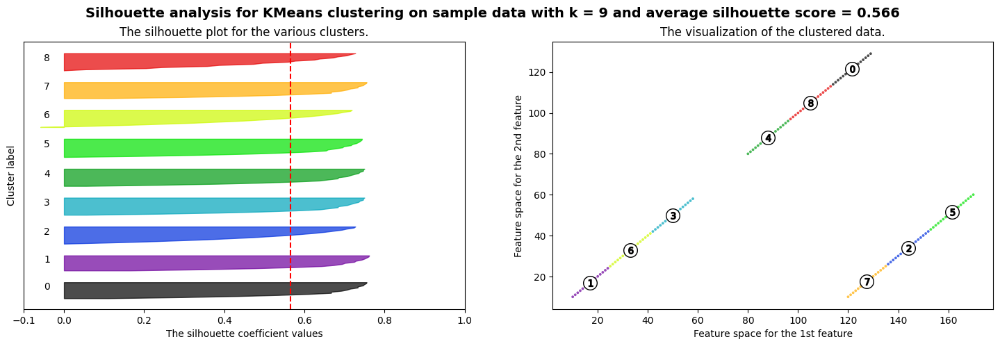

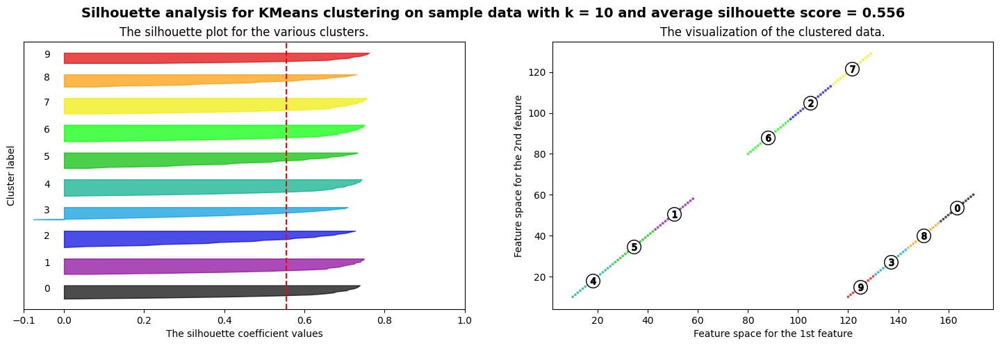

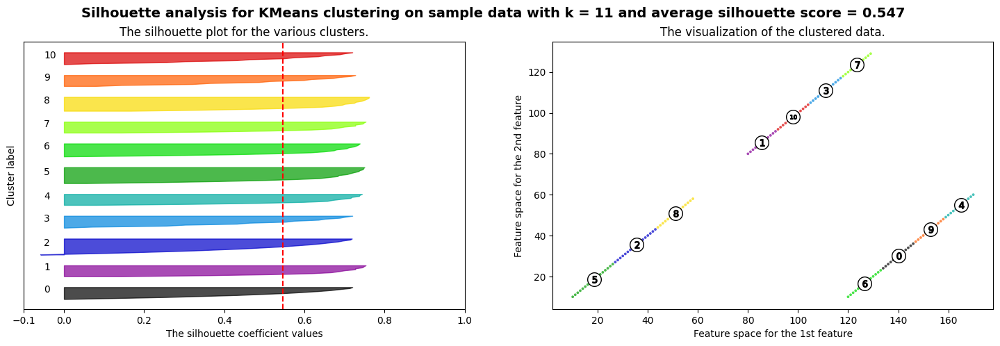

Best k for dataset 1 is: 3
Best silhouette score for dataset 1 is: 0.723


In [18]:
plot_silhouette(data1)
print("Best k for dataset 1 is:", best_k1)
print("Best silhouette score for dataset 1 is: %.3f" % best_silhouette1)

# A sinistra il coefficiente di silhouette per ogni cluster, a destra i cluster
# A sinistra, lo spessore del cluster indica la sua dimensione. La riga rossa indica il valore medio del coefficiente di silhouette
# Si preferisce il valore k per cui il coefficiente di silhouette è maggiore e la dimensione dei cluster è più o meno uniforme
# In questo si preferisce k=3 perchè il coefficiente di silhouette è maggiore e la dimensione dei cluster è uniforme.

## Plot della Silhouette con differenti numero k di clusters per il dataset 2

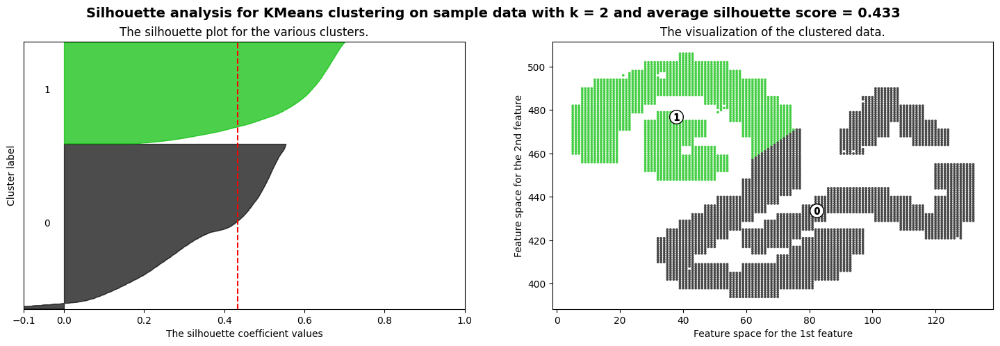

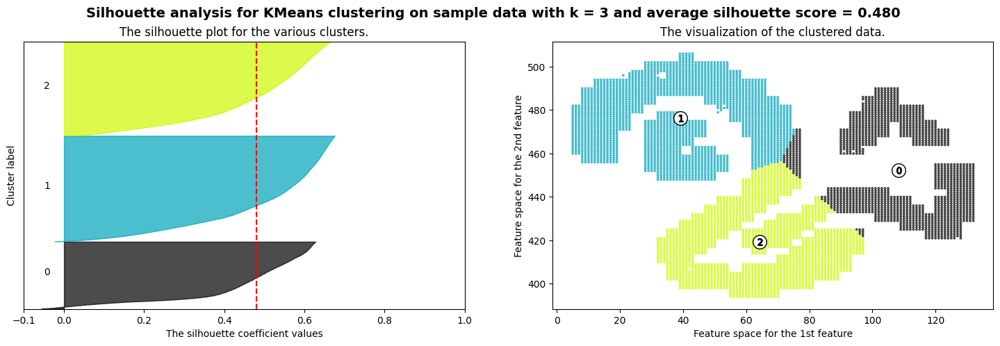

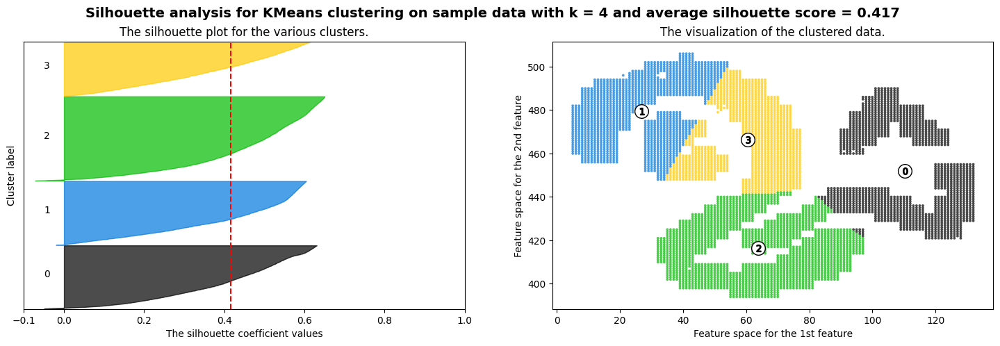

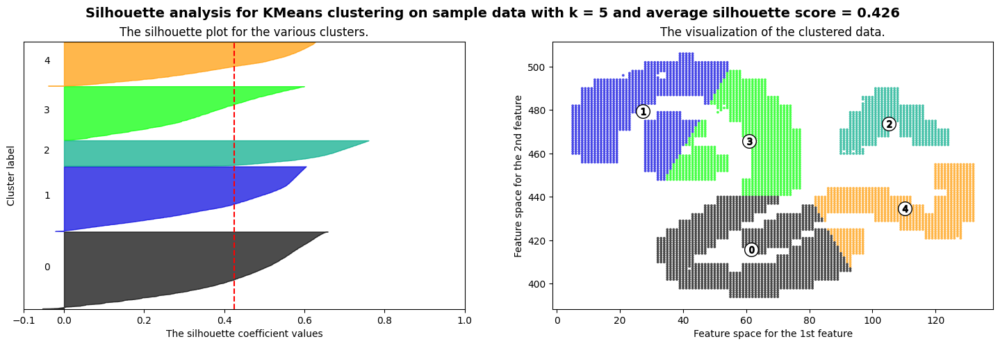

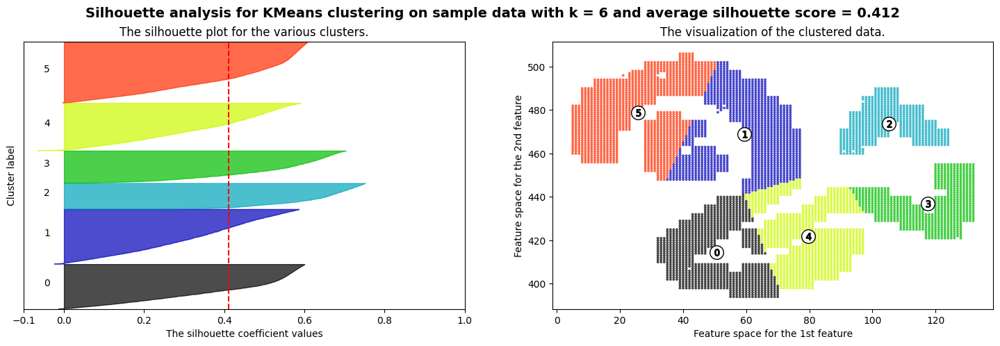

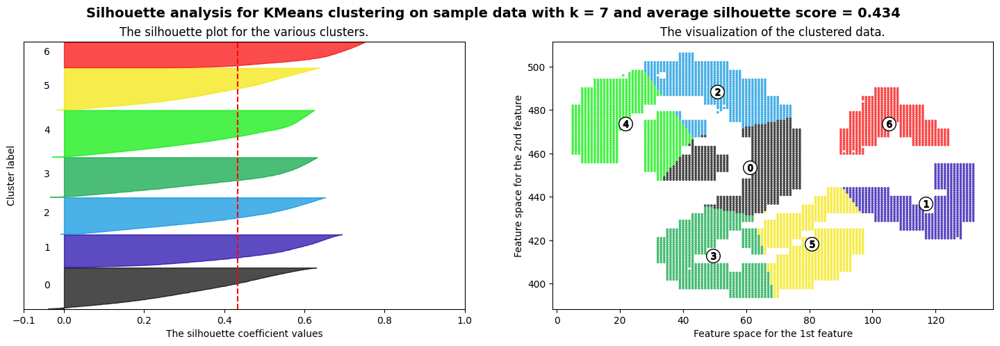

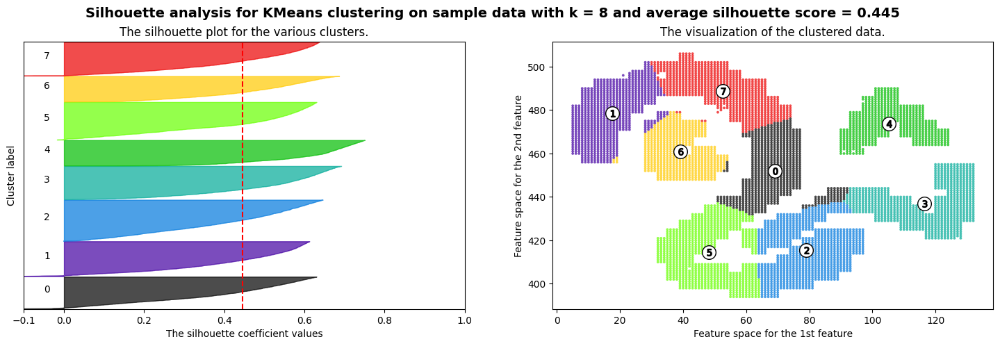

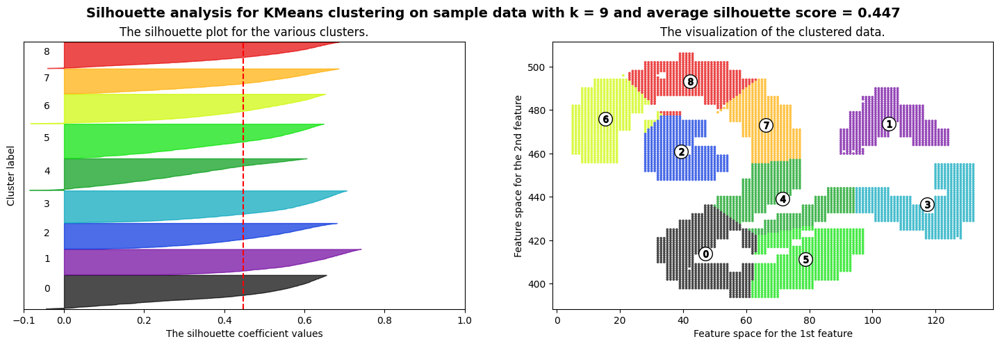

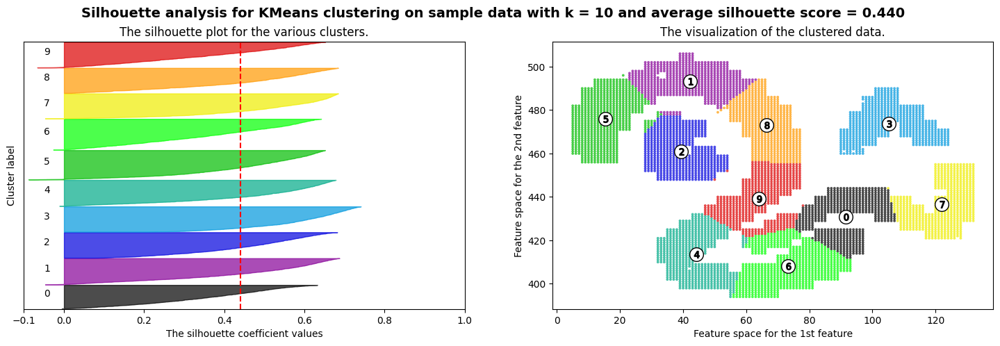

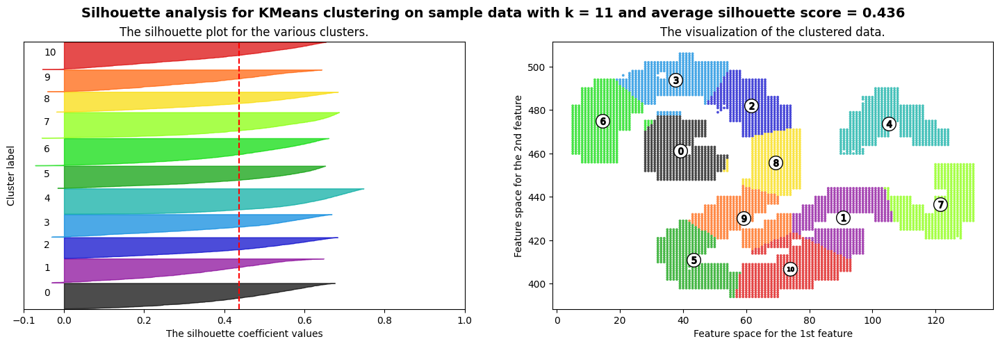

Best k for dataset 2 is: 3
Best silhouette score for dataset 2 is: 0.480


In [19]:
plot_silhouette(data2)
print("Best k for dataset 2 is:", best_k2)
print("Best silhouette score for dataset 2 is: %.3f" % best_silhouette2)

## Plot della Silhouette con differenti numero k di clusters per il dataset 3

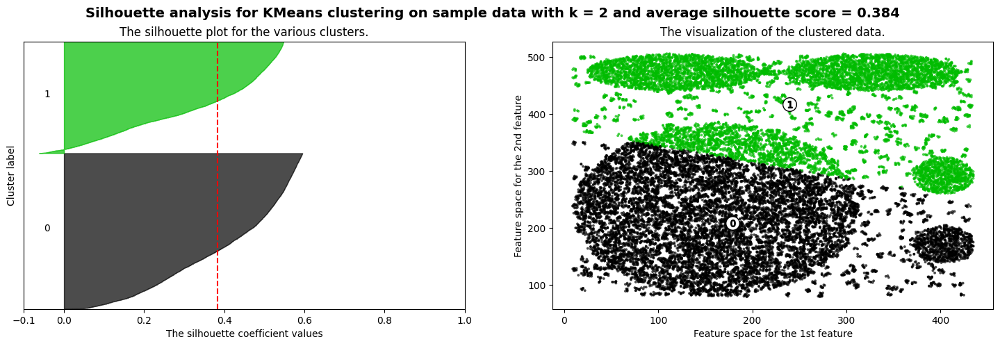

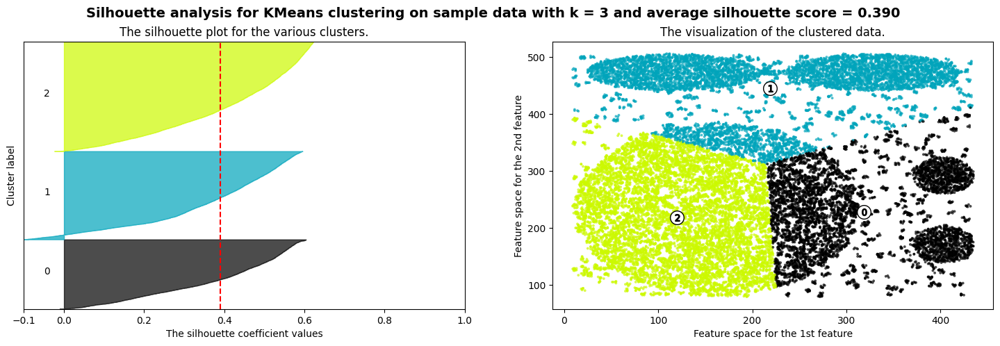

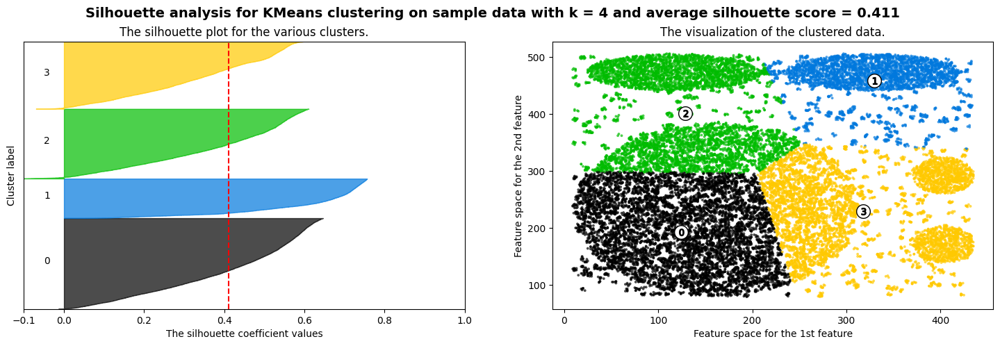

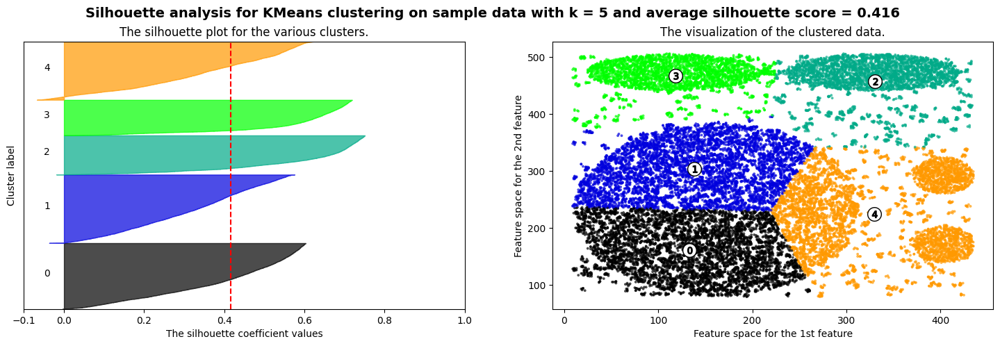

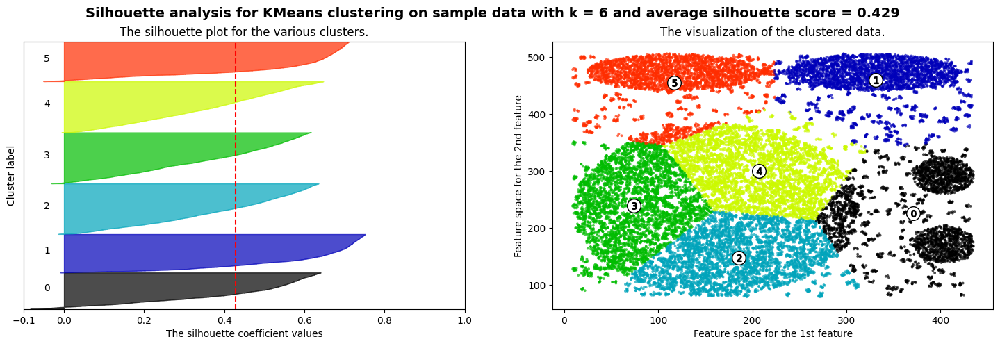

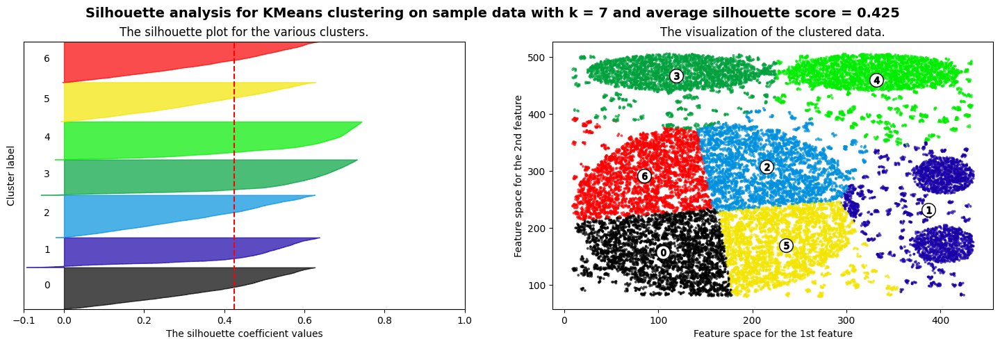

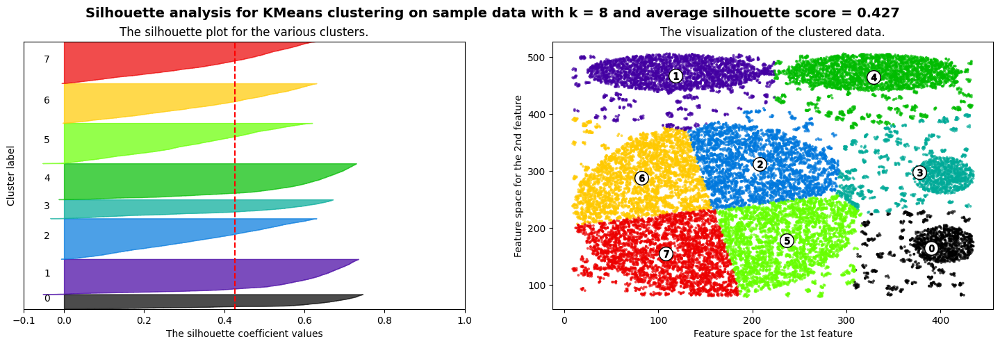

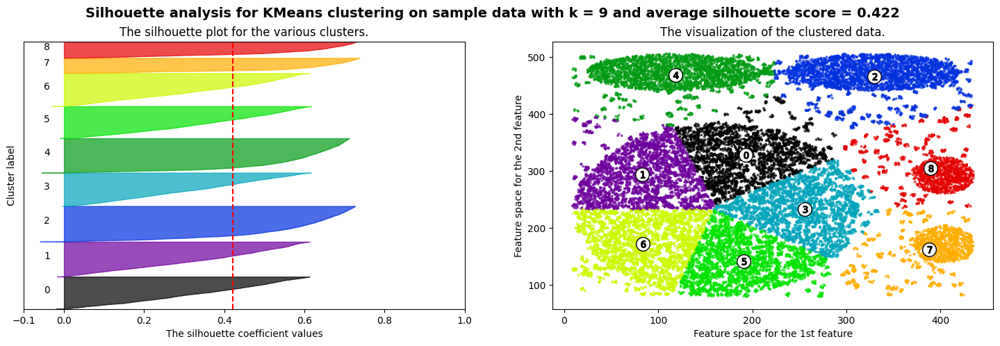

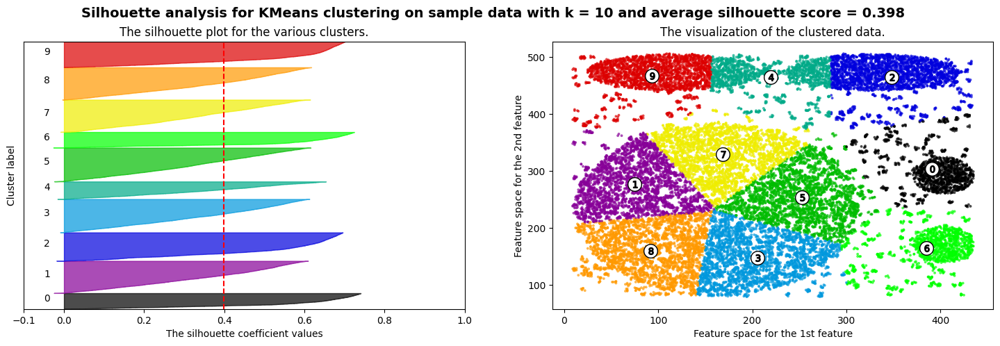

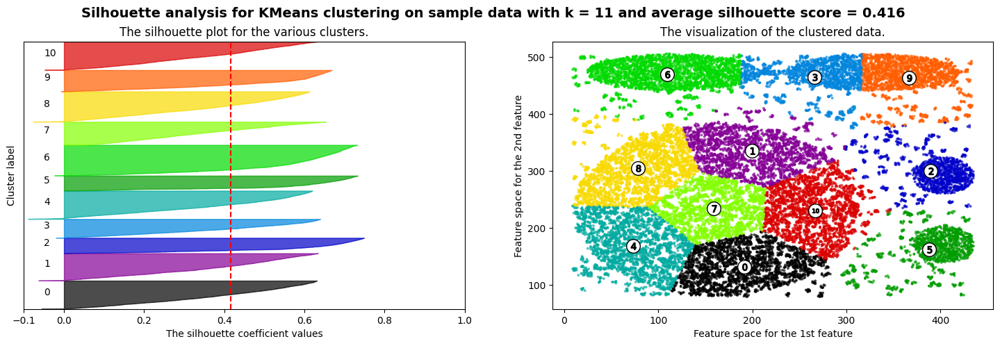

Best k for dataset 3 is: 6
Best silhouette score for dataset 3 is: 0.429


In [20]:
plot_silhouette(data3_extract)
print("Best k for dataset 3 is:", best_k3)
print("Best silhouette score for dataset 3 is: %.3f" % best_silhouette3)

## Definisco la funzione per plottare DBSCAN

In [3]:
from sklearn.cluster import DBSCAN

def plot_dbscan(title, dataset, dbscan):
    fig = plt.figure(figsize=(8,8))

    fig.set_facecolor('white')

    ax = fig.add_subplot(111)
    fig.subplots_adjust(top=1)
    ax.set_title(title)

    ax.set_xlabel(feature_names3[0])
    ax.set_ylabel(feature_names3[1])

    #plot the dataset
    plt.scatter(dataset[:,0], dataset[:,1], c=dbscan, cmap='Paired')

    plt.show()

## DBSCAN con parametri casuali sul dataset 2

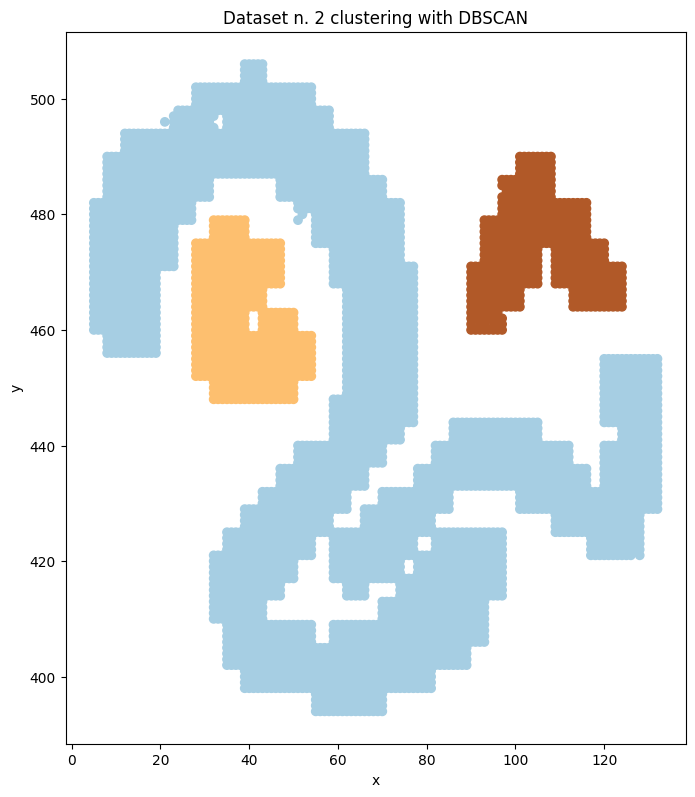

In [12]:
from sklearn.cluster import DBSCAN

# Inserisco epsilon = 3 in modo da discriminare bene i cluster. 
# Con valori più piccoli venivano accorpati tutti cluster in uno solo perchè troppo vicini
dbscan = DBSCAN(eps=3, min_samples=10).fit_predict(data2)
plot_dbscan('Dataset n. 2 clustering with DBSCAN', data2, dbscan)

## DBSCAN con parametri casuali sul dataset 3

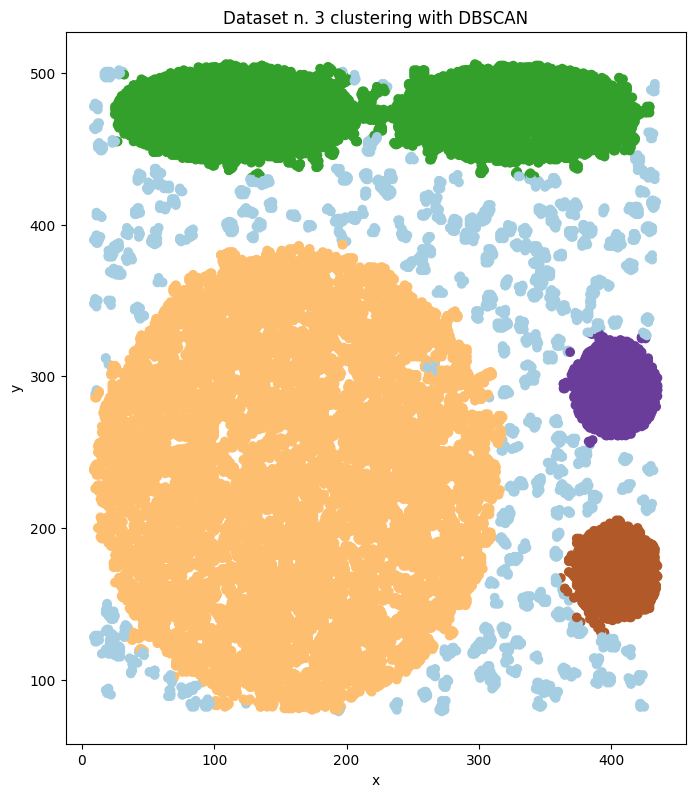

In [23]:
from sklearn.cluster import DBSCAN

# Inserisco epsilon = 10 in modo da discriminare bene i cluster. 
# Con valori più piccoli venivano accorpati tutti cluster in uno solo perchè troppo vicini
# Min samples = 50 per evitare che vengano considerati punti di noise con bassa densità
dbscan = DBSCAN(eps=10, min_samples=50).fit_predict(data3_extract)
plot_dbscan('Dataset n. 3 clustering with DBSCAN', data3_extract, dbscan)

## Definisco alcune funzioni per effettuare plot delle distanze restituite da Nearest Neighbors ed il plot del punto di Elbow

In [36]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt

# Utilizzo il metodo kneighbors per trovare i k vicini di ogni punto e restituisco la distanza
# kneighbors restituisce un array con le distanze dei k vicini di ogni punto
def nearest_neighbours(dataset, k):
    nbrs = NearestNeighbors(n_neighbors=k).fit(dataset)
    distances, indices = nbrs.kneighbors(dataset)
    # Restituisco le distanze del k-esimo vicino per tutti i punti ordinato in modo crescente
    distances = np.sort(distances[:,k-1], axis=0)
    return distances, indices

In [37]:
# Come x prendo i punti e come y le distanze dal k-esimo vicino, la curva è crescente in quanto le distanze sono ordinate in modo crescente
def plot_nearest_neighbours(title, distances):
    plt.plot(distances)
    plt.title(title)
    plt.xlabel("Points")
    plt.ylabel("Distance")
    plt.show()

In [38]:
from kneed import KneeLocator

def plot_elbow_and_return_knee_value(title, distances):
    i = np.arange(len(distances))
    
    # Come x prendo i punti e come y le distanze dal k-esimo vicino, la curva è crescente in quanto le distanze sono ordinate in modo crescente
    knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

    fig = plt.figure(figsize=(5, 5))
    knee.plot_knee()
    plt.title(title)
    plt.xlabel("Points")
    plt.ylabel("Distance")

    return distances[knee.knee]

## Utilizzo Nearest Neighbors per trovare il valore di EPS migliore e plotto le distanze (dataset 3)

Se usassi MinPts = 10 e qundi n_neighbors = 10, per il dataset 3 sarebbe un valore troppo piccolo e non riuscirei a distinguere i clusters correttamente.

Esattamente troverei tanti clusters nei punti di noise e non riuscirei a distinguere i clusters principali che hanno una densità molto maggiore

### MinPts = 10

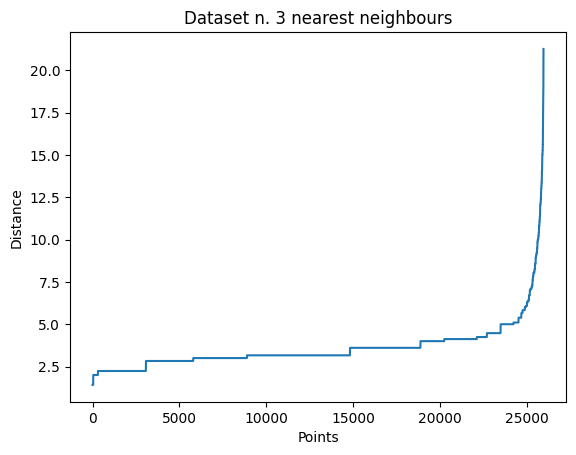

In [39]:
distances3, indices3 = nearest_neighbours(data3_extract, 10)
plot_nearest_neighbours('Dataset n. 3 nearest neighbours', distances3)

#### Identifico il punto di Elbow

<Figure size 500x500 with 0 Axes>

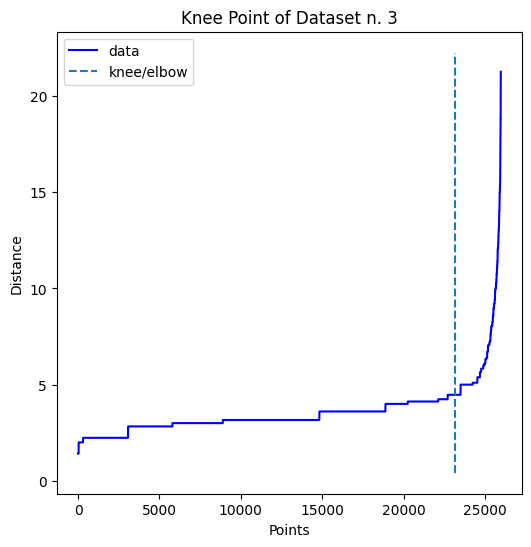

In [40]:
# L'elbow è il punto in cui la curva cambia direzione, il punto in cui la curva cresce più rapidamente
# Questo punto è il migliore come parametro EPS per DBSCAN, in quanto i punti successivi saranno quelli più rumorosi, lontani dagli altri punti e quindi sono outliers.
# Andando a settare questo parametro, noi non consideriamo più questi punti outliers
eps_estimation3 = plot_elbow_and_return_knee_value('Knee Point of Dataset n. 3', distances3)

#### Utilizzo il punto di Elbow trovato come parametro EPS in DBSCAN

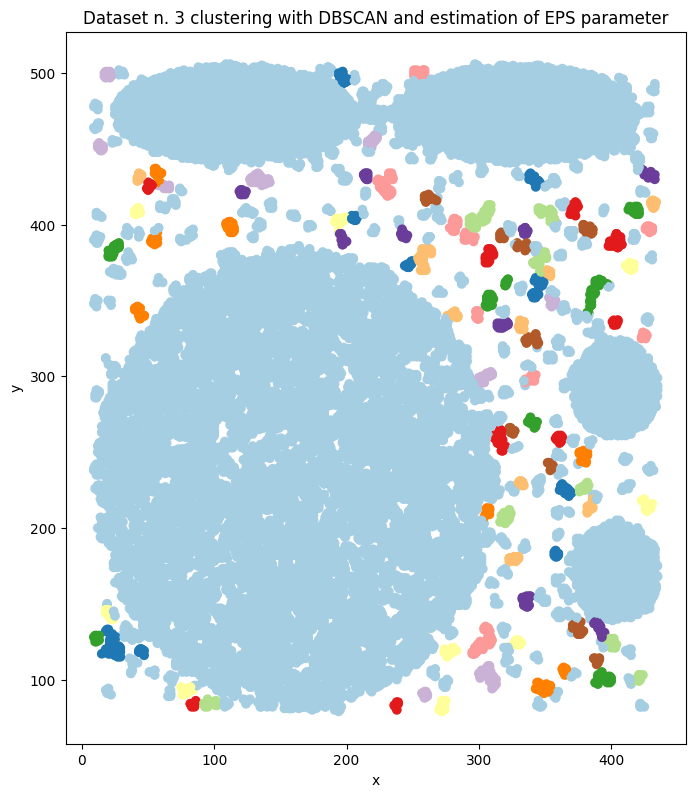

In [29]:
from sklearn.cluster import DBSCAN
dbscan3 = DBSCAN(eps=eps_estimation3, min_samples=10).fit_predict(data3_extract)
plot_dbscan('Dataset n. 3 clustering with DBSCAN and estimation of EPS parameter', data3_extract, dbscan3)

### MinPts = 50

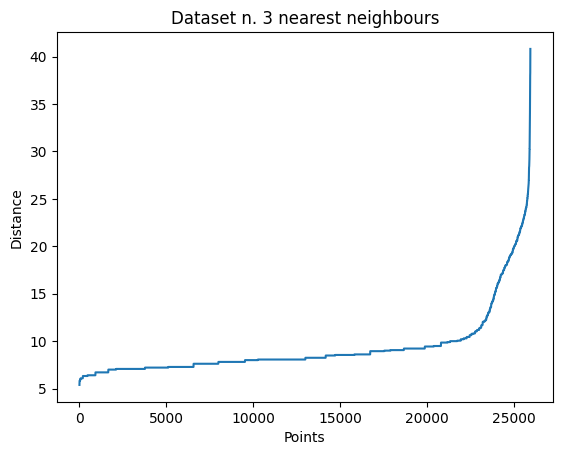

In [26]:
distances3, indices3 = nearest_neighbours(data3_extract, 50)

plot_nearest_neighbours('Dataset n. 3 nearest neighbours', distances3)

#### Identifico il punto di Elbow

<Figure size 500x500 with 0 Axes>

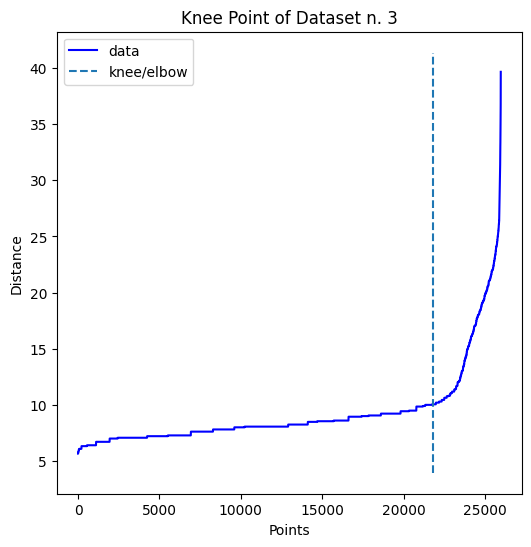

In [31]:
eps_estimation3 = plot_elbow_and_return_knee_value('Knee Point of Dataset n. 3', distances3)

#### Utilizzo il punto di Elbow trovato come parametro EPS in DBSCAN

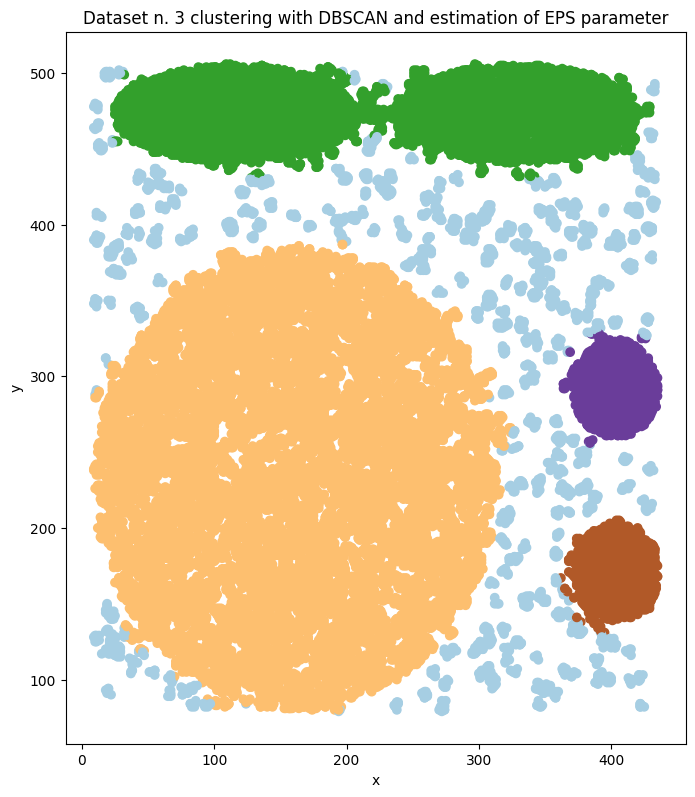

In [32]:
from sklearn.cluster import DBSCAN
dbscan3 = DBSCAN(eps=eps_estimation3, min_samples=50).fit_predict(data3_extract)
plot_dbscan('Dataset n. 3 clustering with DBSCAN and estimation of EPS parameter', data3_extract, dbscan3)

## Utilizzo Nearest Neighbors per trovare il valore di EPS migliore e plotto le distanze (dataset 2)

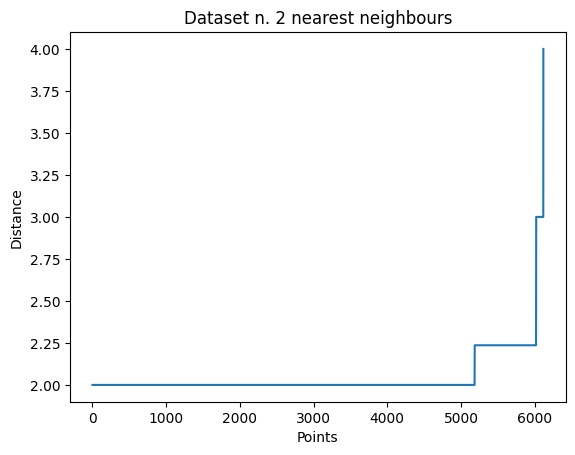

In [33]:
from scipy.interpolate import interp1d

distances2, indices2 = nearest_neighbours(data2, 10)

plot_nearest_neighbours('Dataset n. 2 nearest neighbours', distances2)

### Identifico il punto di Elbow

<Figure size 500x500 with 0 Axes>

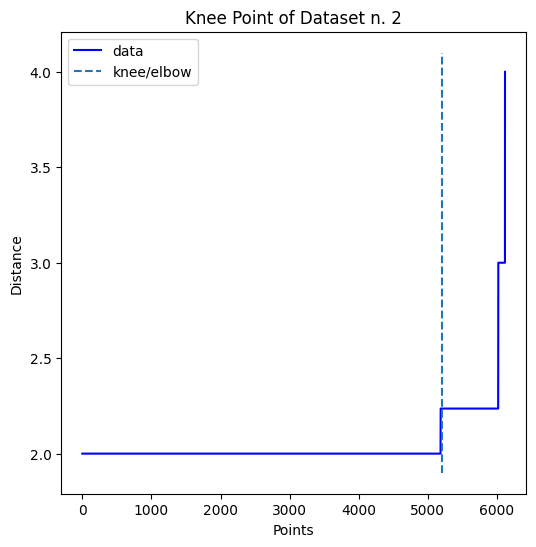

In [34]:
eps_estimation2 = plot_elbow_and_return_knee_value('Knee Point of Dataset n. 2', distances2)

### Utilizzo il punto di Elbow trovato come parametro EPS in DBSCAN

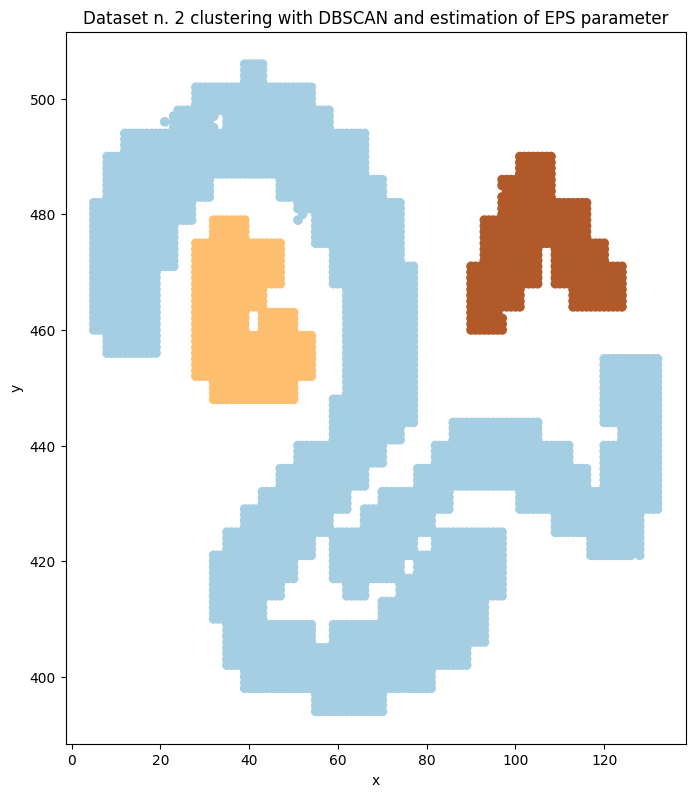

In [35]:
from sklearn.cluster import DBSCAN
dbscan2 = DBSCAN(eps=eps_estimation2, min_samples=10).fit_predict(data2)
plot_dbscan('Dataset n. 2 clustering with DBSCAN and estimation of EPS parameter', data2, dbscan2)